In [1]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import seaborn as sns
import random
def plot_learning_curve(time_points, potential_values, highlight_time_point=0):
    """
    Plots the learning curve of the distributed learning algorithm.
    """
    plt.figure(figsize=(8, 5))
    plt.plot(time_points, potential_values, color='green', linestyle='dashed', linewidth=1, markersize=5)
    if highlight_time_point != 0:
        plt.scatter(time_points[highlight_time_point], potential_values[highlight_time_point], color='green')
    plt.xlabel("Time")
    plt.ylabel("Potential")
    plt.title("Distributed Learning Algorithm")
    plt.grid()
    plt.show()

def count_infected_neighbors(node, graph, states):
    """
    Counts the number of infected neighbors of a node in the graph.
    """
    return sum(states[neighbor] == 1 for neighbor in graph.neighbors(node))


def plot_epidemic_trends(weeks, values, ylabel, title):
    """
    Enhanced plotting of epidemic trends over time.
    """
    sns.set(style="whitegrid")  # Set Seaborn style
    plt.figure(figsize=(10, 6))
    plt.plot(weeks, values, color="teal", marker='o', linestyle='-', linewidth=2, markersize=8)
    plt.xticks(weeks, fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel("Weeks", fontsize=14)
    plt.ylabel(ylabel, fontsize=14)
    plt.title(title, fontsize=16)
    plt.show()


def plot_combined_epidemic_trends(weeks, data, labels, title):
    """
    Plots multiple epidemic trends on a single graph.

    Parameters:
        weeks (list): List of weeks.
        data (list of lists): Each sublist contains values for a specific trend.
        labels (list of str): Labels for each trend.
        title (str): Title of the plot.
    """
    sns.set(style="whitegrid")  # Set Seaborn style
    plt.figure(figsize=(10, 6))

    for values, label in zip(data, labels):
        plt.plot(weeks, values, marker='o', linestyle='-', linewidth=2, markersize=8, label=label)

    plt.xticks(weeks, fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel("Weeks", fontsize=14)
    plt.ylabel("Counts", fontsize=14)
    plt.title(title, fontsize=16)
    plt.legend()
    plt.show()

ModuleNotFoundError: No module named 'matplotlib'

In [ ]:


def simulate_epidemic(node_count, infection_rate=0.3, recovery_rate=0.7, initial_infected_count=10, total_weeks=15, random_graph=False):

    if not random_graph:
      # Create a cycle graph and add extra edges
      #print("with certain graph")
      graph = nx.cycle_graph(node_count)
      for node in range(node_count):
          graph.add_edge(node, (node + 2) % node_count)
          graph.add_edge(node, (node - 2) % node_count)

    else:
      #print("with random")
      graph = create_preferential_attachment_graph(6, node_count)

    # for making sure neighbors are ok
    #print ("mean of neighbor:",np.mean(list(dict(graph.degree).values())))

    # Initialize the states of nodes
    states = np.zeros(node_count)
    infected_nodes = np.random.choice(node_count, size=initial_infected_count, replace=False)
    states[infected_nodes] = 1

    # Initialize lists to store weekly data
    weekly_new_infected, weekly_susceptible, weekly_infected, weekly_recovered = [], [], [], []
    previous_states = states.copy()

    # Run the simulation over the specified number of weeks
    for _ in range(total_weeks):
        new_infections = 0
        new_recoveries = 0

        # Update states for each node
        for node in range(node_count):
            if states[node] == 1 and random.random() < recovery_rate:  # Infected and might recover
                previous_states[node] = 2
                new_recoveries += 1
            elif states[node] == 0:  # Susceptible
                infected_neighbors = count_infected_neighbors(node, graph, states)
                if random.random() < (1 - (1 - infection_rate) ** infected_neighbors):
                    new_infections += 1
                    previous_states[node] = 1

        states = previous_states.copy()
        weekly_new_infected.append(new_infections)
        weekly_susceptible.append(np.sum(states == 0))
        weekly_infected.append(np.sum(states == 1))
        weekly_recovered.append(np.sum(states == 2))

    return weekly_new_infected, weekly_susceptible, weekly_infected, weekly_recovered



In [ ]:
n_nodes = 500

n_i_w, s, i, r = simulate_epidemic(n_nodes)


In [ ]:
n_i_w #this are the number of new infected at the end of each week

[11, 9, 7, 8, 3, 3, 2, 1, 2, 2, 0, 0, 0, 0, 0]

In [ ]:
# Initialize arrays to store averages over 100 simulations for 15 weeks
avg_new_infected = np.zeros(15)  # Array for average number of new infections each week
avg_s = np.zeros(15)             # Array for average number of susceptible individuals each week
avg_i = np.zeros(15)             # Array for average number of infected individuals each week
avg_r = np.zeros(15)             # Array for average number of recovered individuals each week

# Initialize 'week' as a list from 1 to 15
week = list(range(1, 16, 1))

# Loop through 100 simulations
for i in range(100):
    # Simulate the epidemic for 'n_nodes' nodes using the 'simulate_epidemic' function
    n_i_w, s, i, r = simulate_epidemic(n_nodes)

    # Stack the results vertically to calculate the average later
    avg_new_infected = np.vstack((avg_new_infected, n_i_w.copy()))
    avg_s = np.vstack((avg_s, s.copy()))
    avg_i = np.vstack((avg_i, i.copy()))
    avg_r = np.vstack((avg_r, r.copy()))


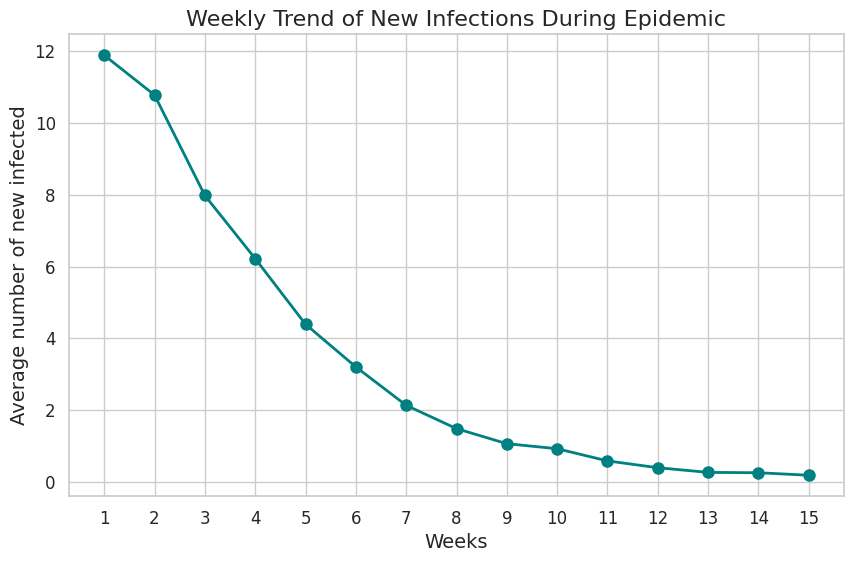

In [ ]:
plot_epidemic_trends(week, np.average(avg_new_infected[1:],axis=0), 'Average number of new infected', "Weekly Trend of New Infections During Epidemic" )

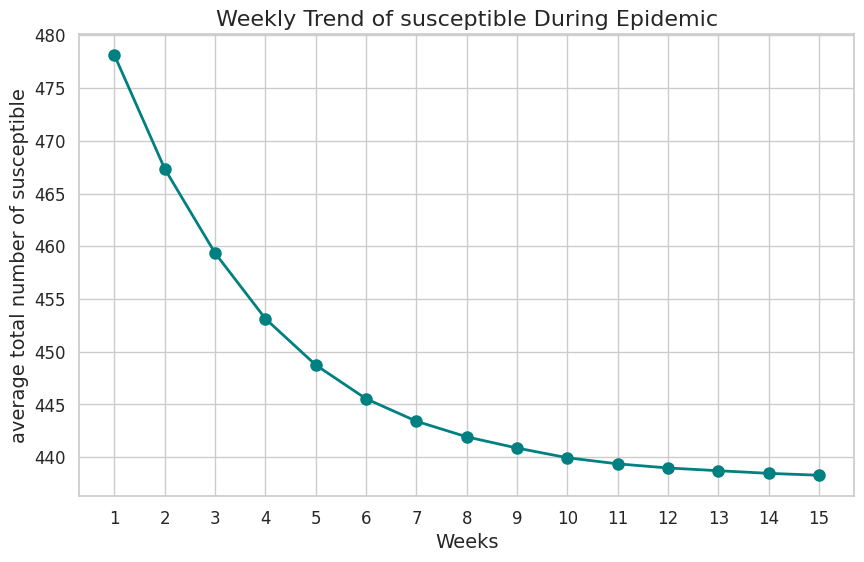

In [ ]:
plot_epidemic_trends(week, np.average(avg_s[1:],axis=0), 'average total number of susceptible',"Weekly Trend of susceptible During Epidemic")

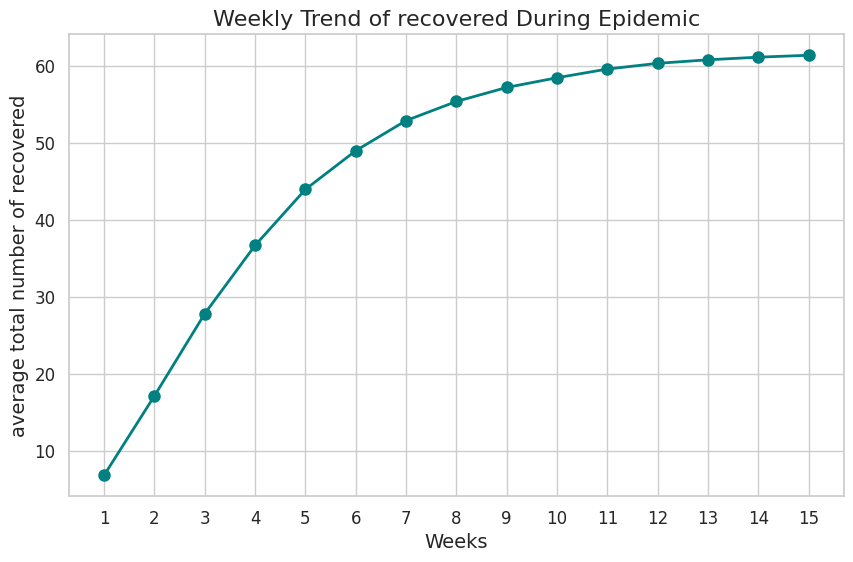

In [ ]:
plot_epidemic_trends(week, np.average(avg_r[1:],axis=0), 'average total number of recovered',"Weekly Trend of recovered During Epidemic")

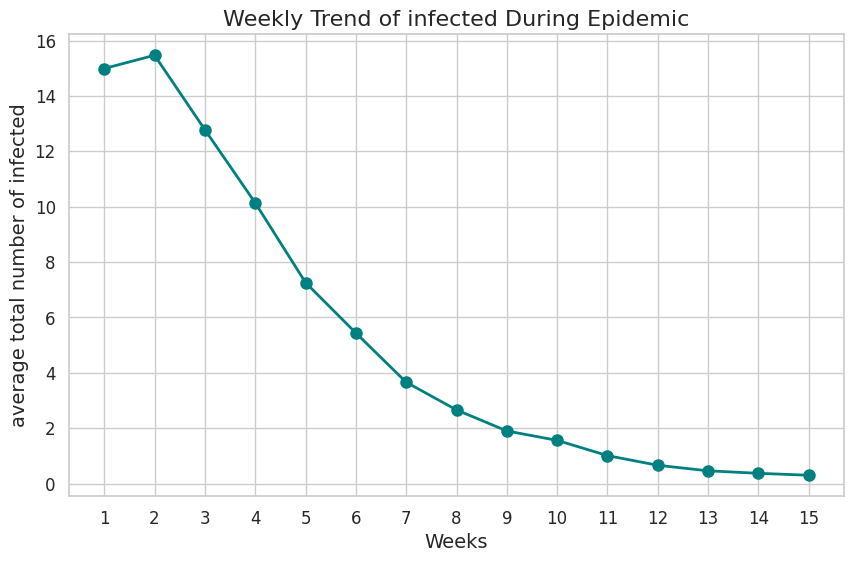

In [ ]:
plot_epidemic_trends(week, np.average(avg_i[1:],axis=0), 'average total number of infected',"Weekly Trend of infected During Epidemic")

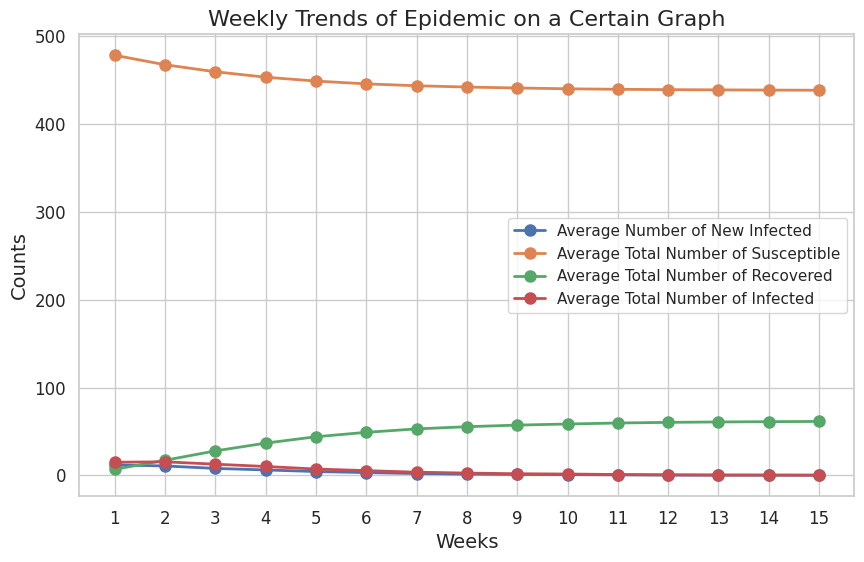

In [ ]:
plot_combined_epidemic_trends(
    week,
    [
        np.average(avg_new_infected[1:], axis=0),
        np.average(avg_s[1:], axis=0),
        np.average(avg_r[1:], axis=0),
        np.average(avg_i[1:], axis=0)
    ],
    [
        'Average Number of New Infected',
        'Average Total Number of Susceptible',
        'Average Total Number of Recovered',
        'Average Total Number of Infected'
    ],
    "Weekly Trends of Epidemic on a Certain Graph"
)

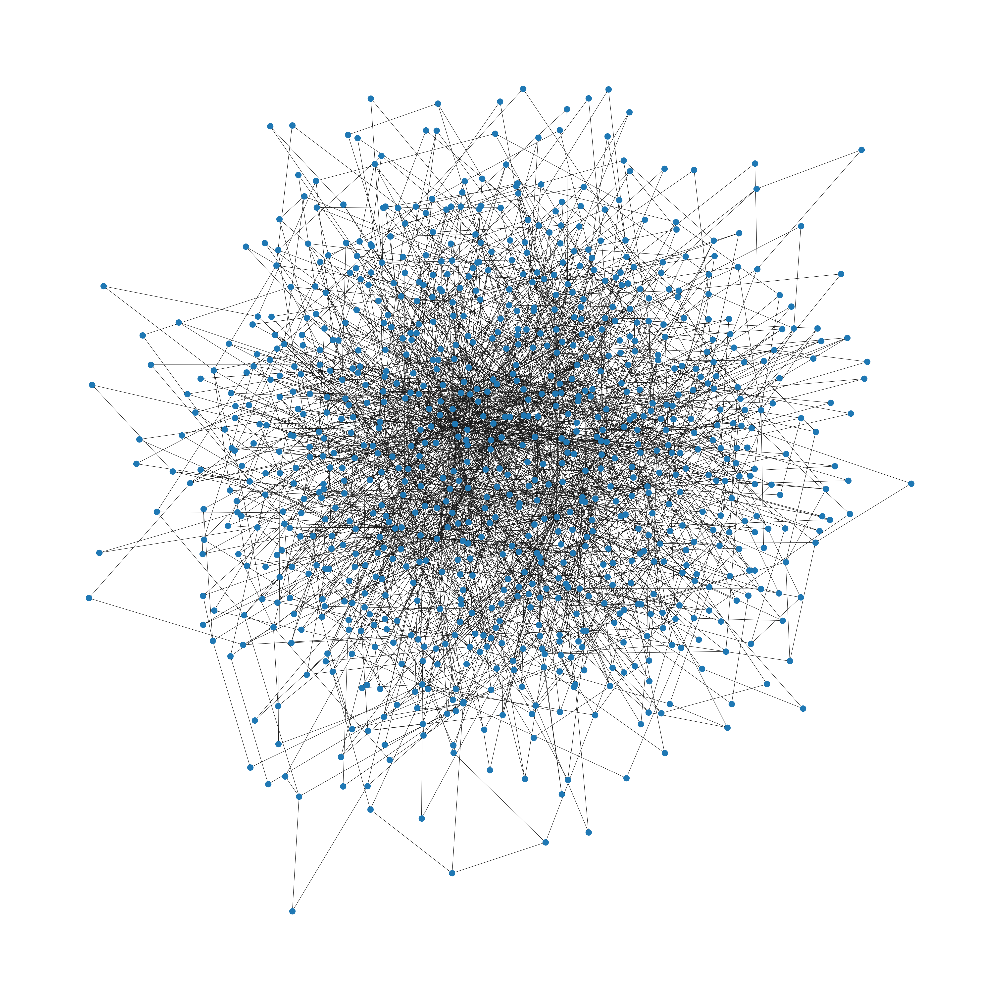

In [ ]:
import math

def create_preferential_attachment_graph(k, node_count):
    # Start with a complete graph on k+1 nodes
    graph = nx.complete_graph(k + 1)
    round_up = False  # Alternating flag for rounding

    for node in range(k + 1, node_count):
        # Calculate the probability distribution based on node degrees
        degrees = [degree for _, degree in graph.degree()]
        probabilities = [degree / sum(degrees) for degree in degrees]

        # Determine the number of links for the new node
        num_links = math.ceil(k / 2) if round_up else math.floor(k / 2)
        round_up = not round_up if k % 2 != 0 else round_up

        # Choose neighbors and add edges
        neighbors = np.random.choice(len(graph), size=num_links, p=probabilities, replace=False)
        for neighbor in neighbors:
            graph.add_edge(node, neighbor)

    return graph

# Example usage
graph = create_preferential_attachment_graph(5, 900)
plt.figure(figsize=(40,40))
nx.draw(graph, with_labels=False)


In [ ]:
avg_new_infected=np.zeros(15)
avg_s=np.zeros(15)
avg_i=np.zeros(15)
avg_r=np.zeros(15)
week = list(range(1,16,1))

for i in range(100):
    n_i_w, s, i , r = simulate_epidemic(n_nodes, random_graph= True)

    avg_new_infected = np.vstack(( avg_new_infected,n_i_w.copy()))
    avg_s = np.vstack(( avg_s,s.copy()))
    avg_i = np.vstack(( avg_i,i.copy()))
    avg_r = np.vstack(( avg_r,r.copy()))

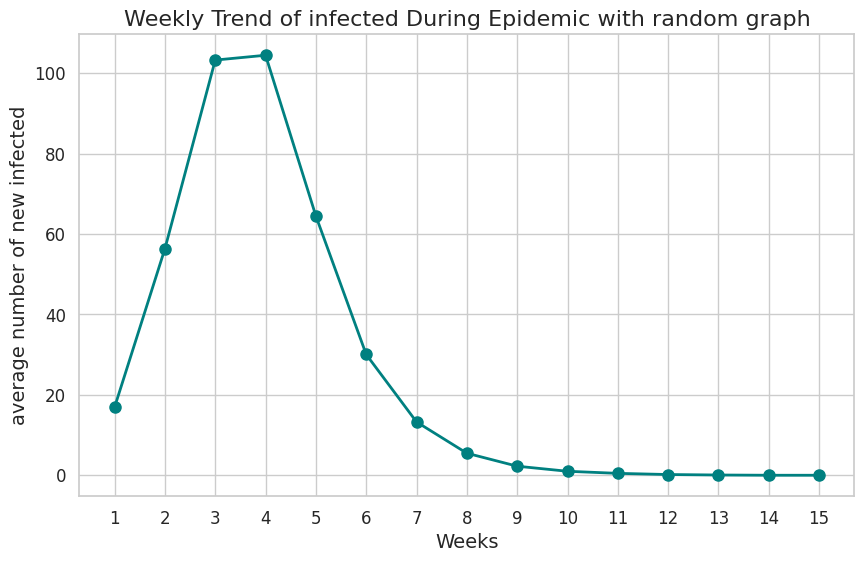

In [ ]:
plot_epidemic_trends(week, np.average(avg_new_infected[1:],axis=0), 'average number of new infected',"Weekly Trend of infected During Epidemic with random graph" )

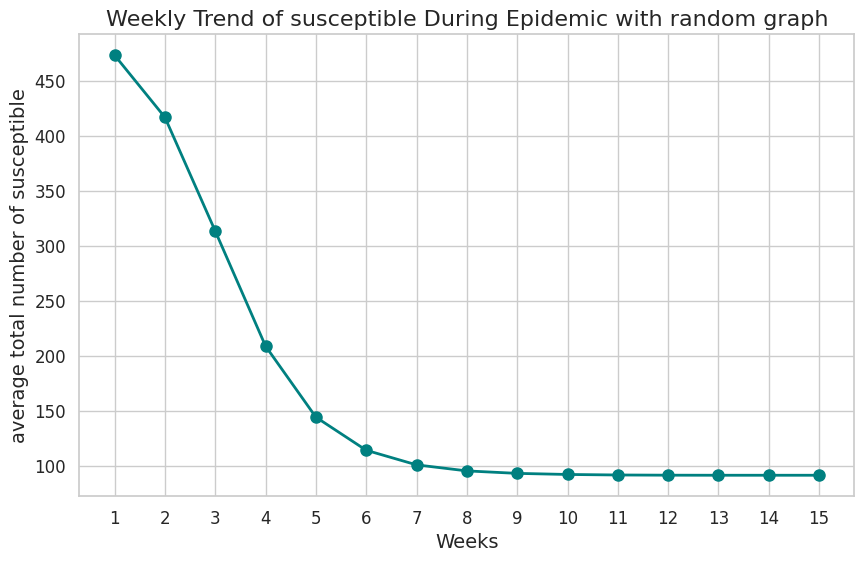

In [ ]:
plot_epidemic_trends(week, np.average(avg_s[1:],axis=0), 'average total number of susceptible',"Weekly Trend of susceptible During Epidemic with random graph" )

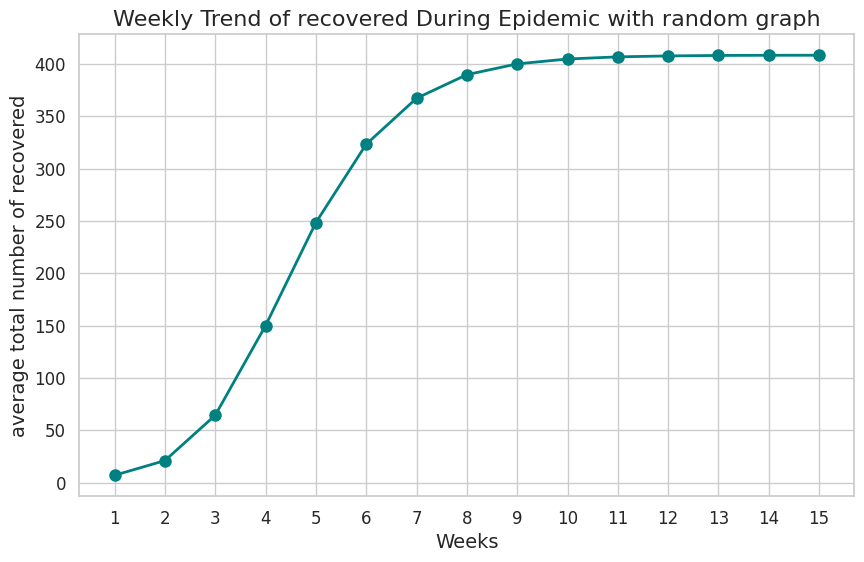

In [ ]:
plot_epidemic_trends(week, np.average(avg_r[1:],axis=0), 'average total number of recovered',"Weekly Trend of recovered During Epidemic with random graph" )

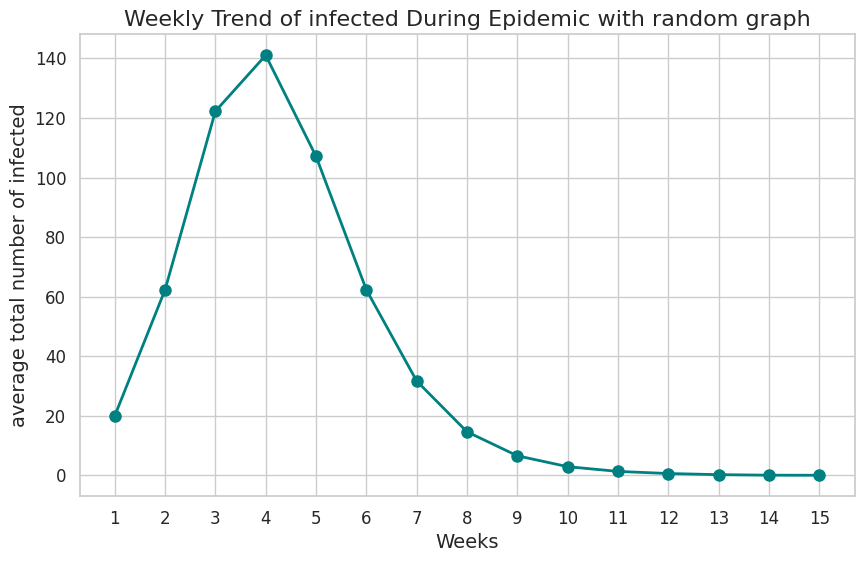

In [ ]:
plot_epidemic_trends(week, np.average(avg_i[1:],axis=0), 'average total number of infected', "Weekly Trend of infected During Epidemic with random graph" )

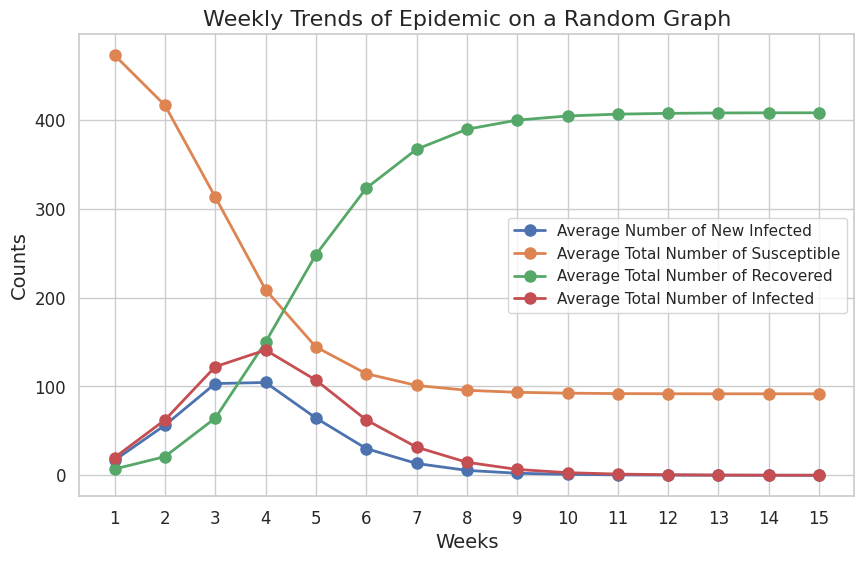

In [ ]:
plot_combined_epidemic_trends(
    week,
    [
        np.average(avg_new_infected[1:], axis=0),
        np.average(avg_s[1:], axis=0),
        np.average(avg_r[1:], axis=0),
        np.average(avg_i[1:], axis=0)
    ],
    [
        'Average Number of New Infected',
        'Average Total Number of Susceptible',
        'Average Total Number of Recovered',
        'Average Total Number of Infected'
    ],
    "Weekly Trends of Epidemic on a Random Graph"
)

### 1.3

In [ ]:
#1.3
import numpy as np
import random

# Setting up initial variables
weekly_vaccinations = [25, 50, 50, 50, 50, 50, 25, 0, 0, 0, 0, 0, 0, 0, 0]
transmission_rate = 0.3
recovery_prob = 0.7



# Function to simulate epidemic with vaccination
def simulate_epidemic_optimized(graph):
    unvaccinated_individuals = np.arange(500)
    individual_states = np.zeros(500)
    individual_states[np.random.choice(500, size=10, replace=False)] = 1

    # Data structure to hold weekly results
    weekly_data = {
        "new_infections": [],
        "vaccinated": [],
        "susceptible": [],
        "infected": [],
        "recovered": [],
        "vaccinated_count": []
    }

    for week in range(15):
        vaccinations = weekly_vaccinations[week]
        selected_for_vaccine = np.random.choice(unvaccinated_individuals, size=vaccinations, replace=False)
        unvaccinated_individuals = np.setdiff1d(unvaccinated_individuals, selected_for_vaccine)
        individual_states[selected_for_vaccine] = 3

        new_infections = 0
        updated_states = individual_states.copy()

        for node in range(500):
            random_value = random.random()
            if individual_states[node] == 1 and random_value < recovery_prob:
                updated_states[node] = 2
            elif individual_states[node] == 0:
                infected_neighbors = count_infected_neighbors(node, graph, individual_states)
                infection_probability = 1 - ((1 - transmission_rate) ** infected_neighbors)
                if random_value < infection_probability and infected_neighbors > 0:
                    new_infections += 1
                    updated_states[node] = 1

        individual_states = updated_states

        # Collecting weekly data
        weekly_data["new_infections"].append(new_infections)
        weekly_data["vaccinated"].append(vaccinations)
        weekly_data["susceptible"].append(np.sum(individual_states == 0))
        weekly_data["infected"].append(np.sum(individual_states == 1))
        weekly_data["recovered"].append(np.sum(individual_states == 2))
        weekly_data["vaccinated_count"].append(np.sum(individual_states == 3))

    return [weekly_data[key] for key in weekly_data]

# Creating a graph for simulation
# Replace with your method of creating a graph
n_nodes = 500
G2 = create_preferential_attachment_graph(6, n_nodes)

# Running the simulation
new_infections_weekly, new_vaccinations_weekly, susceptible, infected, recovered, vaccinated = simulate_epidemic_optimized(G2)

# Statistical analysis of the simulation
# This part can be further optimized based on your requirements
average_new_infections = np.zeros(15)
average_new_vaccinations = np.zeros(15)
average_susceptible = np.zeros(15)
average_infected = np.zeros(15)
average_recovered = np.zeros(15)
average_vaccinated = np.zeros(15)
weeks = list(range(1, 16))

for _ in range(100):
    niw, nvw, s, i, r, v = simulate_epidemic_optimized(G2)
    average_new_infections += np.array(niw)
    average_new_vaccinations += np.array(nvw)
    average_susceptible += np.array(s)
    average_infected += np.array(i)
    average_recovered += np.array(r)
    average_vaccinated += np.array(v)

# Averaging the data
average_new_infections /= 100
average_new_vaccinations /= 100
average_susceptible /= 100
average_infected /= 100
average_recovered /= 100
average_vaccinated /= 100


In [ ]:
import matplotlib.pyplot as plt

# Assuming plot_epidemic_trends is already defined and works correctly
def plot_all_epidemic_trends(weeks, data_sets, titles, subtitles):
    """
    Plots multiple epidemic trend graphs.

    :param weeks: List of weeks.
    :param data_sets: List of data sets to plot.
    :param titles: List of titles for each plot.
    :param subtitles: List of subtitles for each plot.
    """
    for data, title, subtitle in zip(data_sets, titles, subtitles):
        plot_epidemic_trends(weeks, data, title, subtitle)
        plt.show()  # Show the plot

# Your averaged data
average_new_infections /= 100
average_new_vaccinations /= 100
average_susceptible /= 100
average_infected /= 100
average_recovered /= 100
average_vaccinated /= 100

# Titles and subtitles for each plot
titles = [
    'average number of new infected with vaccination',
    'average number of new vaccinated',
    'average total number of susceptible with vaccination',
    'average total number of recovered with vaccination',
    'average total number of infected with vaccination',
    'average total number of vaccinated'
]

subtitles = ["Week"] * len(titles)  # Assuming all plots have the subtitle "Week"

# Data sets
data_sets = [
    average_new_infections,
    average_new_vaccinations,
    average_susceptible,
    average_recovered,
    average_infected,
    average_vaccinated
]

# Call the function to plot all trends
plot_all_epidemic_trends(weeks, data_sets, titles, subtitles)


### 1.4

In [ ]:
from sklearn.model_selection import ParameterGrid
import ast

In [ ]:
k_0=[9,10,11]
b_0=[0.2,0.3,0.4]
p_0=[0.5,0.6,0.7]
I_0= [1,3,5,9,17,32,32,17,5,2,1,0,0,0,0]
n=934
new_vaccinated=[46,37,65,74,74,74,65,65,46,9,0,0,0,0,0]

In [ ]:
def NWS_small_world_graph(k, n, p=0.05):
    return ((p <= 1) or (p >= 0) or (n > 0) or (k <= n) or (k > 1)) and nx.newman_watts_strogatz_graph(n, k, p)

def configuration_model(k, n):
    return nx.Graph(nx.configuration_model([k]*n))

In [ ]:
def min_value(data):
    tmp = []
    for i in data.values():
        tmp.append( math.sqrt(( 1/15 ) * sum(( i[0] - np.array( I_0 )) ** 2 )))
    min = np.array(tmp).min()   #find the parameters with the min rmse
    min_value = list(data.keys())[ tmp.index(min) ] #parameters that return the min rmse

    return min_value, min

In [ ]:
def new_params(d, delta1, delta2):
    return [d['b'] - delta1, d['b'], d['b'] + delta1], [d['k'] - delta2, d['k'], d['k'] + delta2], [d['p'] - delta1, d['p'], d['p'] + delta1]

In [ ]:
def plot_result(data, I_0, b_v):
    fig, ax = plt.subplots(figsize=(9,9), dpi=120)
    ax.plot([int(i) for i in data[b_v][0]], color='red',linewidth=2, markersize=5, label= 'simulation result')
    ax.plot(I_0, color='blue',linewidth=2, markersize=5, label= 'real pandemic')
    ax.set_xlabel("Week")
    ax.set_ylabel("new infected")
    ax.set_title("Graph of new infected prople per week simulation vs real pandemic")
    ax.grid()
    ax.legend()
    plt.show()

In [ ]:
def epidemic_sweden(k_0, b_0, p_0, n):
    grid = ParameterGrid({'b': b_0, 'p': p_0, 'k': k_0})
    final_new_avg_infected = {}
    final_infected = {}
    final_susceptible = {}
    final_recovered = {}

    for params in grid:
      graph = create_preferential_attachment_graph(params['k'], n)
      new_avg_infected = []
      res_infected = []
      res_recovered = []
      res_susceptible = []

      for i in range(10):

          new_avg = susceptible_avg = infected_avg = recovered_avg = np.zeros(15)
          not_vaccinated= list(range(n))
          state = np.zeros(n)
          random_num = np.random.randint(n)
          state[random_num] = 1
          new_infected_week = []  #number of infected of each week
          state_t_prec = state.copy()
          susceptible_tmp = []
          infected_tmp = []
          recovered_tmp = []

          for j in range(15):
              select = np.random.choice(not_vaccinated, size = new_vaccinated[j], replace = False)
              state[select] = state_t_prec[select] = 3
              n_infected = 0

              filtered_not_vaccinated = []
              for person in not_vaccinated:
                  if person not in select:
                      filtered_not_vaccinated.append(person)
              not_vaccinated = filtered_not_vaccinated

              i = 0
              while i < 500:
                  v = random.random()
                  #susceptible
                  if(state[i] == 0):
                      m = count_infected_neighbors(i, graph, state)
                      p_i_infected = 1 - ( ( 1 - params['b'] ) ** m)
                      if( v < p_i_infected and m > 0 ):
                          state_t_prec[i] = 1
                          n_infected += 1
                  #just infected
                  if(state[i] == 1) and (v < params['p']) :
                      state_t_prec[i] = 2

                  i += 1

              new_infected_week.append(n_infected)
              state = state_t_prec.copy()
              susceptible_tmp.append(list(state).count(0))
              infected_tmp.append(list(state).count(1))
              recovered_tmp.append(list(state).count(2))

          new_avg = np.vstack((new_avg, new_infected_week.copy()))
          susceptible_avg = np.vstack((susceptible_avg, susceptible_tmp.copy()))
          infected_avg = np.vstack((infected_avg, infected_tmp.copy()))
          recovered_avg = np.vstack((recovered_avg, recovered_tmp.copy()))

      # average of infected for each week after the 10 simulation
      new_avg_infected.append(np.average(new_avg[1:],axis=0))
      res_infected.append(np.average(infected_avg[1:],axis=0))
      res_recovered.append(np.average(recovered_avg[1:],axis=0))
      res_susceptible.append(np.average(susceptible_avg[1:],axis=0))

      params_key = str(params)
      final_infected[params_key] = res_infected
      final_susceptible[params_key] = res_susceptible
      final_recovered[params_key] = res_recovered
      final_new_avg_infected[params_key] = new_avg_infected

    return final_new_avg_infected, final_infected, final_susceptible, final_recovered

In [ ]:
def main_code(k_0, b_0, p_0, n):
  lowest_difference = 1000
  best_params_so_far = {}
  previous_params = {}

  for t in range(100):
      res, infected, susceptible, recovered = epidemic_sweden(k_0, b_0, p_0, n)
      params, minimum_difference = min_value(res)
      print("params:")
      print(params)
      print("minimum_difference:")
      print(minimum_difference)
      print(res)

      if params == previous_params:
          print("in return")
          return params, res, infected, susceptible, recovered
      previous_params = params

      if minimum_difference < lowest_difference:
          lowest_difference = minimum_difference
          best_params_so_far = params
          b_0, k_0, p_0 = new_params(ast.literal_eval(params), 0.1, 1)
      else:
          b_0, k_0, p_0 = new_params(ast.literal_eval(best_params_so_far), 0.05, 1)

  return best_params_so_far, res, infected, susceptible, recovered

In [ ]:
bv_preferential_attachment, res_preferential_attachment, infected_preferential_attachment, susceptible_preferential_attachment, recovered_preferential_attachment = main_code(k_0, b_0, p_0, n)


params:
{'b': 0.3, 'k': 9, 'p': 0.6}
minimum_difference:
7.229568912920511
{"{'b': 0.2, 'k': 9, 'p': 0.5}": [array([ 0.,  0.,  0.,  1.,  1., 12., 29., 22., 17., 10., 13., 10.,  2.,
        1.,  1.])], "{'b': 0.2, 'k': 9, 'p': 0.6}": [array([ 1.,  2., 11., 15., 44., 46., 34., 11.,  6.,  3.,  1.,  1.,  1.,
        1.,  0.])], "{'b': 0.2, 'k': 9, 'p': 0.7}": [array([ 1.,  8., 31., 45., 56., 37., 18.,  8.,  2.,  0.,  0.,  1.,  0.,
        0.,  0.])], "{'b': 0.2, 'k': 10, 'p': 0.5}": [array([ 1.,  1., 18., 19., 36., 53., 45., 10.,  6.,  6.,  2.,  0.,  2.,
        2.,  1.])], "{'b': 0.2, 'k': 10, 'p': 0.6}": [array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])], "{'b': 0.2, 'k': 10, 'p': 0.7}": [array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])], "{'b': 0.2, 'k': 11, 'p': 0.5}": [array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])], "{'b': 0.2, 'k': 11, 'p': 0.6}": [array([ 3., 19., 61., 82., 59., 25.,  5.,  5.,  2.,  2.,  0.,  0.,  0.,
     

In [ ]:
plot_result(res_preferential_attachment, I_0, bv_preferential_attachment)
plot_epidemic_trends(week, [int(i) for i in susceptible_preferential_attachment[bv_preferential_attachment][0]], 'average number of new susceptible with preferential attachment', 'weeks')
plot_epidemic_trends(week, [int(i) for i in recovered_preferential_attachment[bv_preferential_attachment][0]], 'average number of new recovered with preferential attachment', 'weeks')

# 2 coloring

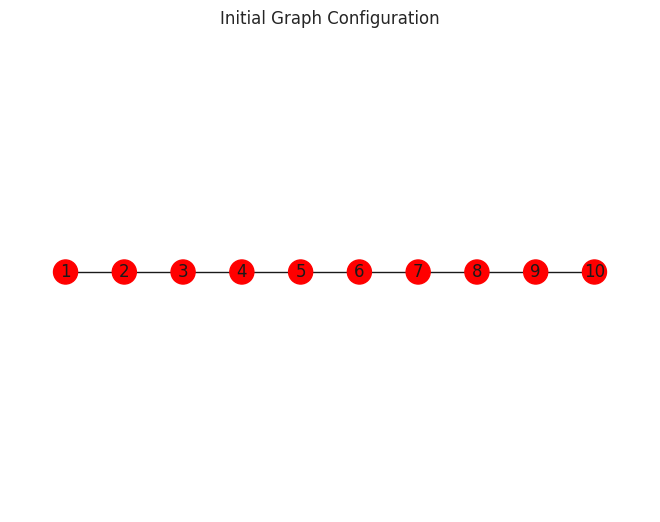

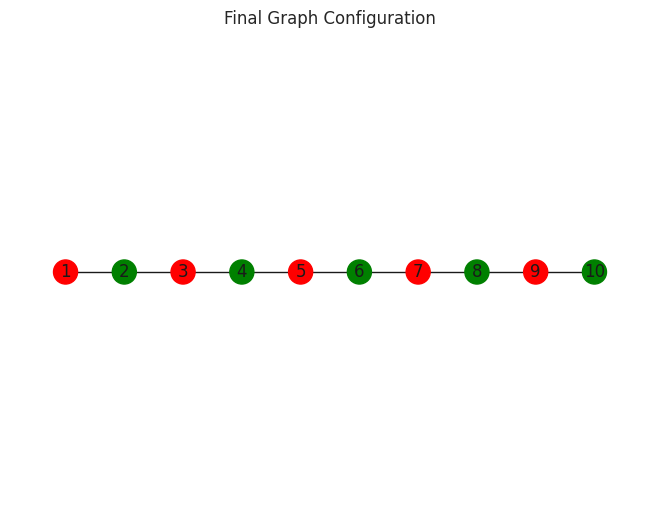

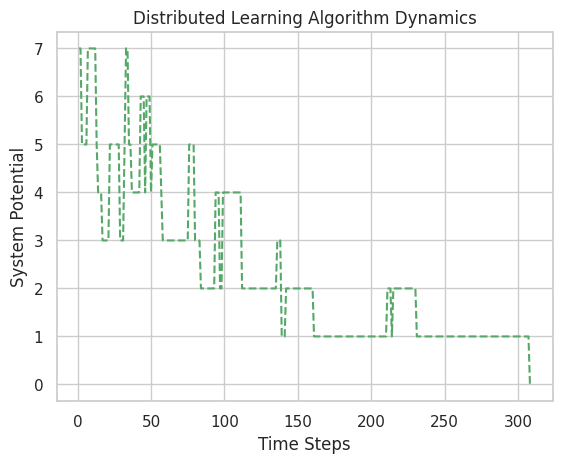

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import random
import math

class GraphSimulation:
    def __init__(self, node_count):
        # Initialize a path graph with nodes from 1 to node_count. All nodes are initially red.
        self.graph = nx.path_graph(range(1, node_count + 1))
        self.red_nodes = list(self.graph.nodes)  # All nodes start as red
        self.green_nodes = []  # No green nodes initially
        self.potential_values = []  # Track potential over time
        self.time_record = []  # Keep a record of each time step
        # Set initial positions of nodes in a linear fashion for visualization
        self.positions = {node: (node, 0) for node in self.graph.nodes()}

    def run_simulation(self):
        # Begin the simulation by drawing the initial state of the graph
        self.draw_graph("Initial Graph Configuration")
        current_potential = 1  # Start with a potential to kick off the simulation
        time_step = 0  # Initialize time_step

        # Run the simulation until the potential drops to 0 (system reaches equilibrium)
        while current_potential != 0:
            selected_node = random.choice(list(self.graph.nodes))  # Randomly select a node
            current_potential = self.update_node_color(selected_node, time_step)  # Update its color and recalculate potential
            time_step += 1  # Move to the next time step

            # Record the time and current potential for plotting later
            self.time_record.append(time_step)
            self.potential_values.append(current_potential)

        # Once the simulation is complete, draw the final state of the graph
        self.draw_graph("Final Graph Configuration")

    def update_node_color(self, node, time_step):
        # Decay factor decreases the influence of neighbors over time
        decay_factor = time_step / 100
        # Count the number of green and red neighbors
        green_neighbors = self.count_color_neighbors(node, self.green_nodes)
        red_neighbors = self.count_color_neighbors(node, self.red_nodes)

        # Calculate the probability of the node turning green
        prob_green = self.calculate_probability(decay_factor, green_neighbors, red_neighbors)

        # Randomly decide to switch the node's color based on the calculated probability
        if random.random() < prob_green:
            self.switch_color(node, self.red_nodes, self.green_nodes)
        else:
            self.switch_color(node, self.green_nodes, self.red_nodes)

        # Recalculate the system's potential after the possible color switch
        return self.calculate_potential()

    def count_color_neighbors(self, node, color_nodes):
        # Count how many neighbors of the given node are in the specified color list
        return sum(neighbor in color_nodes for neighbor in self.graph.neighbors(node))

    def calculate_probability(self, decay, green_neighbors, red_neighbors):
        # Calculate the probability of a node turning green based on its neighbors and the decay factor
        numerator = math.exp(-decay * green_neighbors)
        denominator = numerator + math.exp(-decay * red_neighbors)
        return numerator / denominator

    def switch_color(self, node, from_list, to_list):
        # If the node is in the from_list, switch it to the to_list
        if node in from_list:
            from_list.remove(node)
            to_list.append(node)

    def calculate_potential(self):
        # Calculate the system's potential based on the number of same-color neighbor pairs
        same_color_pairs = sum(1 for node in self.graph.nodes for neighbor in self.graph.neighbors(node)
                               if (node in self.red_nodes and neighbor in self.red_nodes) or
                               (node in self.green_nodes and neighbor in self.green_nodes))
        return 0.5 * same_color_pairs

    def draw_graph(self, title):
        # Visualize the graph with nodes colored based on their current state
        color_map = ['red' if node in self.red_nodes else 'green' for node in self.graph.nodes()]
        nx.draw(self.graph, self.positions, with_labels=True, node_color=color_map)
        plt.title(title)
        plt.show()

    def plot_results(self):
        # Plot the change in system potential over time
        plt.plot(self.time_record, self.potential_values, 'g--')
        plt.xlabel("Time Steps")
        plt.ylabel("System Potential")
        plt.title("Distributed Learning Algorithm Dynamics")
        plt.grid(True)
        plt.show()

# Main execution
simulation = GraphSimulation(10)  # Initialize the simulation with 10 nodes
simulation.run_simulation()  # Run the simulation
simulation.plot_results()  # Plot the results at the end


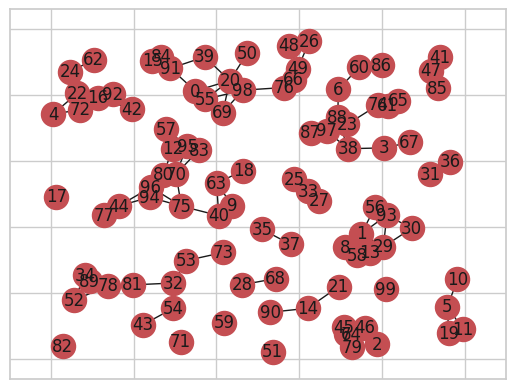

In [ ]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# Load Wi-Fi network data from a .mat file into a NumPy array
Wifi = np.loadtxt('wifi.mat')

# Create a graph from the NumPy array using the updated function
G = nx.from_numpy_array(Wifi)

# Load node coordinates from a .mat file into a NumPy array
coordinate = np.loadtxt('coords.mat')

# Draw the network graph using NetworkX with red nodes and specified positions
nx.draw_networkx(G, pos=coordinate, node_color='r')

# Display the plot
plt.show()


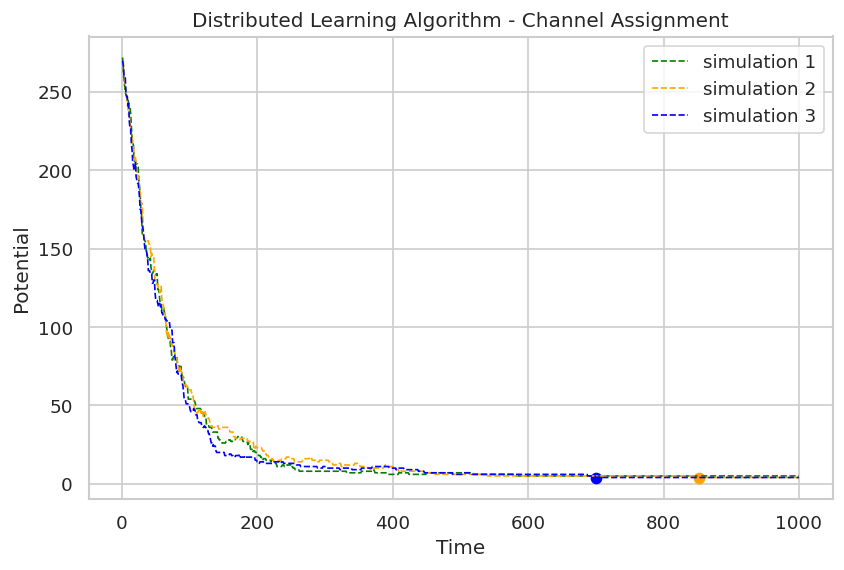

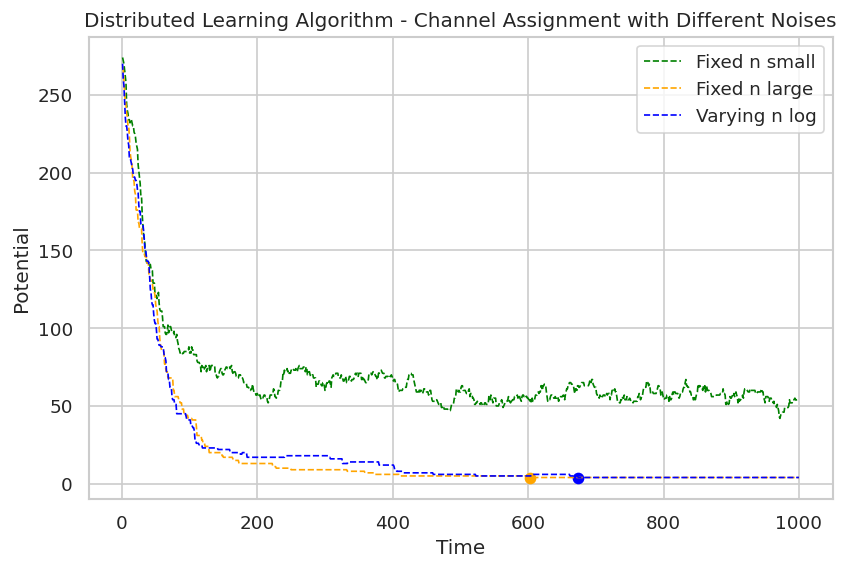

Fixed n small: Minimum potential value: 42.0 at time None
Fixed n large: Minimum potential value: 4.0 at time 603
Varying n log: Minimum potential value: 4.0 at time 674


In [ ]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

class ChannelAssignmentSimulation:
    def __init__(self, graph, coords, learning_rate_sequence, label):
        # Initialize the simulation with the network graph, node coordinates, learning rates, and a label for identification.
        self.graph = graph  # The network graph
        self.coords = coords  # Coordinates of nodes in the graph
        self.learning_rate_sequence = learning_rate_sequence  # Adaptive learning rates over time
        self.color_distribution = {node: 1 for node in range(100)}  # Initialize all nodes with the first color
        self.time_steps = []  # Record of each time step in the simulation
        self.potential_values = []  # Record of the system's potential values over time
        self.first_time_reached_4 = None  # Track when the potential first reaches 4
        self.label = label  # Label to identify the simulation run

    def calculate_potential(self):
        # Calculate the system's potential based on current color assignments, where adjacent same colors increase potential.
        total_cost = 0
        for router, color in self.color_distribution.items():
            for neighbor in list(self.graph.neighbors(router)):
                if self.color_distribution[router] == self.color_distribution[neighbor]:
                    total_cost += 2  # Cost for same color neighbors
                elif abs(self.color_distribution[router] - self.color_distribution[neighbor]) == 1:
                    total_cost += 1  # Lower cost for adjacent colors
        return 0.5 * total_cost  # Return the total potential of the system

    def calculate_color_probabilities(self, current_node, n_factor):
        # Calculate the probabilities of assigning each color to a node based on the current state of its neighbors.
        neighbor_colors = [self.color_distribution[neighbor] for neighbor in self.graph.neighbors(current_node)]
        neighbor_color_counts = {color: neighbor_colors.count(color) for color in neighbor_colors}
        probabilities = []
        for color in range(1, 9):  # Consider 8 possible colors
            # Calculate the cost of assigning each color considering the neighbors' colors
            cost_with_color = sum(2 * count if color == neighbor_color
                                  else 1 * count if abs(color - neighbor_color) == 1
                                  else 0
                                  for neighbor_color, count in neighbor_color_counts.items())
            # Calculate the probability of selecting each color based on the cost
            probabilities.append(np.exp(-n_factor * cost_with_color))
        return np.array(probabilities) / sum(probabilities)  # Normalize probabilities

    def run_simulation(self):
        # Main loop of the simulation: iterate over time steps and update node colors.
        for t, n in enumerate(self.learning_rate_sequence, 1):
            current_node = np.random.randint(0, 100)  # Select a random node to update
            color_probabilities = self.calculate_color_probabilities(current_node, n)  # Calculate color probabilities for the node
            chosen_color = np.random.choice(range(1, 9), p=color_probabilities)  # Choose a new color based on probabilities
            self.color_distribution[current_node] = chosen_color  # Update the node's color

            # Calculate and record the system's potential
            potential = self.calculate_potential()
            if potential == 4 and self.first_time_reached_4 is None:
                self.first_time_reached_4 = t  # Record the first time the potential reaches 4

            self.time_steps.append(t)
            self.potential_values.append(potential)

            if t == 1000:
                break  # End the simulation after 1000 time steps

    def plot_results(self, color):
        # Plot the potential values over time with an optional marker for when potential first reaches 4.
        plt.plot(self.time_steps, self.potential_values, color=color, linestyle='dashed', linewidth=1, markersize=5, label=self.label)
        if self.first_time_reached_4:
            plt.scatter(self.first_time_reached_4, self.potential_values[self.first_time_reached_4 - 1], c=color)  # Mark the first time potential reaches 4

    def print_results(self):
        # Output the minimum potential value and the time it was first reached.
        print(f'{self.label}: Minimum potential value:', min(self.potential_values), 'at time', self.first_time_reached_4)

# Load the graph and coordinates
try:
    network_graph = nx.from_numpy_array(np.loadtxt('wifi.mat'))  # Replace with the actual data
    network_coordinates = np.loadtxt('coords.mat')  # Replace with the actual data
except OSError as e:
    print("Error loading files:", e)
    # Handle error or provide alternative data here

# Perform simulations with different learning rate sequences
learning_rate_sequence = [x / 100 for x in range(1000)]  # Create a learning rate sequence

# Initialize simulations with labels for identification
simulations = [
    ChannelAssignmentSimulation(network_graph, network_coordinates, learning_rate_sequence, f'simulation {i+1}')
    for i in range(3)
]

# Run simulations and plot the results
plt.figure(figsize=(8, 5), dpi=120)
colors = ['green', 'orange', 'blue']  # Colors for different simulation runs
for sim, color in zip(simulations, colors):
    sim.run_simulation()
    sim.plot_results(color)

plt.legend()
plt.xlabel("Time")
plt.ylabel("Potential")
plt.grid(True)
plt.title("Distributed Learning Algorithm - Channel Assignment")
plt.show()

# Additional simulations with fixed and varying n values
fixed_n_small = [0.1] * 1000  # Fixed small learning rate
fixed_n_large = [100] * 1000  # Fixed large learning rate
varying_n_log = [np.log(x+1) for x in range(1000)]  # Varying learning rate based on logarithm

# Run additional simulations with labels for identification
additional_simulations = [
    (ChannelAssignmentSimulation(network_graph, network_coordinates, fixed_n_small, 'Fixed n small'), 'green'),
    (ChannelAssignmentSimulation(network_graph, network_coordinates, fixed_n_large, 'Fixed n large'), 'orange'),
    (ChannelAssignmentSimulation(network_graph, network_coordinates, varying_n_log, 'Varying n log'), 'blue')
]

# Plot the results of additional simulations
plt.figure(figsize=(8, 5), dpi=120)
for sim, color in additional_simulations:
    sim.run_simulation()
    sim.plot_results(color)

plt.xlabel("Time")
plt.ylabel("Potential")
plt.grid(True)
plt.legend()
plt.title("Distributed Learning Algorithm - Channel Assignment with Different Noises")
plt.show()

# Print results of additional simulations for comparison
for sim, _ in additional_simulations:
    sim.print_results()
